# Data augmentation for MoCo v2

This notebook presents several transformations used for data augmentation during the training of `MoCo v2`. The aim of this work is to find transformations that strenghen the quality of the representations learned by `MoCo v2` in the specific field of histopathology.

## Visualization of the tiles extracted for a Whole Slide Image (WSI)


Each WSI is paved by tiles of size $512 \times 512$px. Then 100 tiles are extracted for each WSI(the tile selection algorithm has been coded by Tristan Lazard).

<img src="../assets/TCGA_A1_A0SP_01Z_visu.png" alt="drawing" width="400"/>


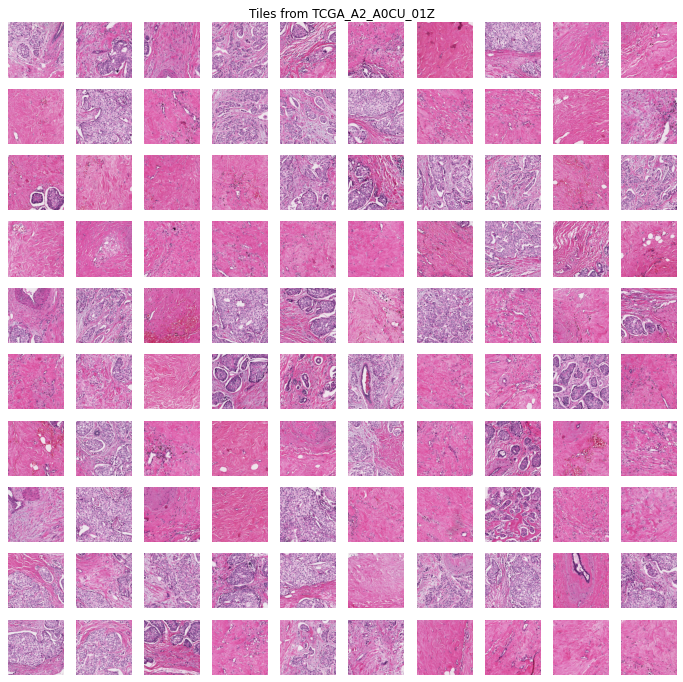

In [57]:
import os 
import matplotlib.pyplot as plt
import random 
import numpy as np 
from PIL import Image, ImageDraw

data_dir = '/mnt/data4/tlazard/dataset_stage/data/'
wsi_list = os.listdir(data_dir)
wsi_index = random.randint(0, len(wsi_list))
wsi_test = wsi_list[wsi_index]
tiles_list = os.listdir(data_dir + wsi_test)

fig = plt.figure(figsize=(12, 12))￼
plt.title('Tiles from {}'.format(wsi_test))512x512px 


plt.axis('off')
for i in range(100):
  image = Image.open(data_dir + wsi_test + '/' + tiles_list[i])
  ax = fig.add_subplot(10, 10, i+1)
  ax.imshow(image)
  ax.axis('off')
plt.show()

## Transformations

The following cells illustrates the transformations that were tested: 
* Crop
* Crop and rotate
* Random HE augmentation 
* Random gray scale
* Flips (horizontal and vertical)
* Color jitters
* Elastic distorsion

For the latter our intuition is that it will spoil the learning since size and shapes of cells are relevant to classify tumour cells from normal ones.

In [83]:
def show_augmentation(transfo, tiles_list):

    transfo = transfo  # not strengthened

    index = random.randint(0, len(tiles_list))
    image_test = Image.open(data_dir + wsi_test + '/' + tiles_list[index])

    fig = plt.figure(figsize=(13, 8))
    plt.axis('off')
    ax = fig.add_subplot(2, 3, 1)
    plt.title('original image')
    ax.imshow(image_test)
    ax.axis('off')
    for i in range(5):
        ax = fig.add_subplot(2, 3, i+2)
        ax.imshow(transfo(image_test))
        plt.title('n°{}'.format(i+1))
        ax.axis('off')
    plt.tight_layout()
    plt.show()

### Crop

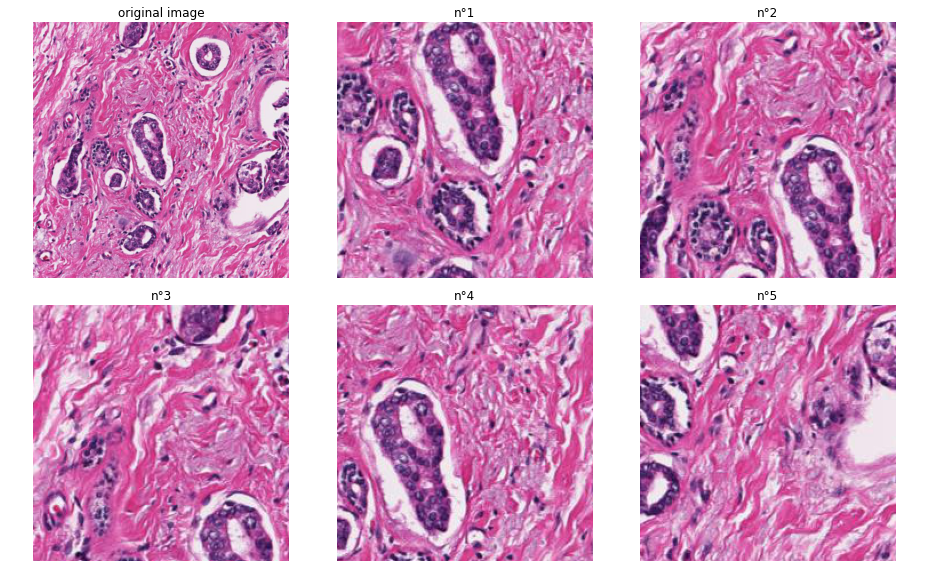

In [62]:
class Crop(object):
    
    def __init__(self, original_size = 512, size = 224):
        self.size = size
        self.original_size = original_size
        
    def __call__(self,x):
        rand1 = random.randint(0, self.original_size - self.size - 1)
        rand2 = random.randint(0, self.original_size - self.size - 1)
        x = x.crop((rand1, rand2, rand1 + 224, rand2 + 224))
        return x

show_augmentation(Crop(), tiles_list)


### Crop and Rotate:
The bounding box is fisrt picked up (in order to take advantage of all the area of the tile) then we select randomly an angle after making sure that the rotated bounding box doesn't comes out of the frame.

In [82]:
import random 
import numpy as np 

def rotate_rect(bbox, angle):
    rad_angle = angle*np.pi/180
    bbox_centered = np.array(bbox - 256)
    x1, y1, x2, y2 = (bbox_centered[0], bbox_centered[1], bbox_centered[2], bbox_centered[3])
    rect_bbox = np.array([
        [x1, x1, x2, x2],
        [y1, y2, y2, y1]])

    rot = np.array([
    [np.cos(rad_angle), -np.sin(rad_angle)],
    [np.sin(rad_angle), np.cos(rad_angle)]]) # define the rotation matrix

    rotated_rect = np.dot(rot, rect_bbox) + 256
    return np.array(rotated_rect, dtype=int)


Illustration of a rotation angle unsuitable for the selected bounding box


 angle: 235 
 bbox_test: [ 69 271 293 495]

 rot_bbox: [[375 559 430 247]
 [400 272  88 217]]

 rot_bbox min : 88

 rot_bbox max : 559


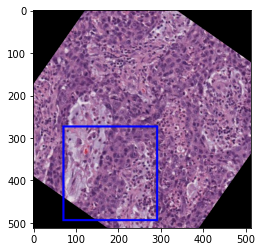

In [34]:

x1, y1 = random.randrange(0, 288), random.randrange(0, 288)
bbox_test = np.array([x1, y1, x1 + 224, y1 + 224], dtype=int)
angle = random.randrange(0, 362)
print('\n angle: {} \n bbox_test: {}'.format(angle, bbox_test))
rot_bbox = rotate_rect(bbox_test, angle)
print('\n rot_bbox: {}'.format(rot_bbox))
print('\n rot_bbox min : {}'.format(np.min(rot_bbox)))
print('\n rot_bbox max : {}'.format(np.max(rot_bbox)))
index = random.randrange(0, len(images_list))
image_test = Image.open(data_dir +'TCGA_A1_A0SP_01Z/'+ images_list[index])

x = image_test.copy()
x = x.rotate(angle)
draw_rect = ImageDraw.Draw(x)
draw_rect.rectangle(list(bbox_test), outline="blue", width=5)
plt.imshow(x)

final angle: 268


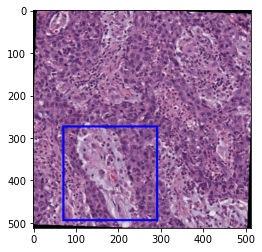

In [35]:
def find_angle(bbox):
    rect_out = True
    while rect_out:
        angle = random.randrange(0, 362)
        rot_bbox = rotate_rect(bbox, angle)
        if np.min(rot_bbox)>0 and np.max(rot_bbox)<512:
            rect_out = False
    return angle

final_angle = find_angle(bbox_test)
print('final angle: {}'.format(final_angle))
y = image_test.copy()
y = y.rotate(final_angle)
draw_rect = ImageDraw.Draw(y)
draw_rect.rectangle(list(bbox_test), outline="blue", width=5)
plt.imshow(y)

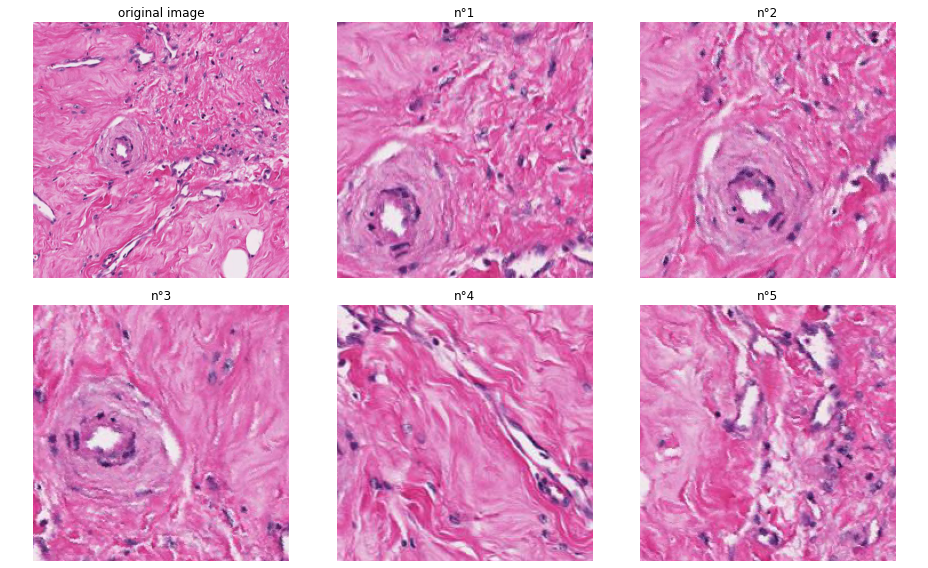

In [64]:
class CropAndRotate(object):
    
    def __init__(self, original_size = 512, size = 224):
        self.size = size
        self.original_size = original_size
        
    def __call__(self,x):
        x1, y1 = random.randrange(0, 288), random.randrange(0, 288)
        bbox = np.array([x1, y1, x1 + 224, y1 + 224], dtype=int)
        final_angle = find_angle(bbox)
        x = x.rotate(final_angle)
        x = x.crop(bbox)
        return x

show_augmentation(CropAndRotate(), tiles_list)

### Random HE augmentation

Adapted from *Quantification of histochemical staining by color deconvolution, Ruifrok*

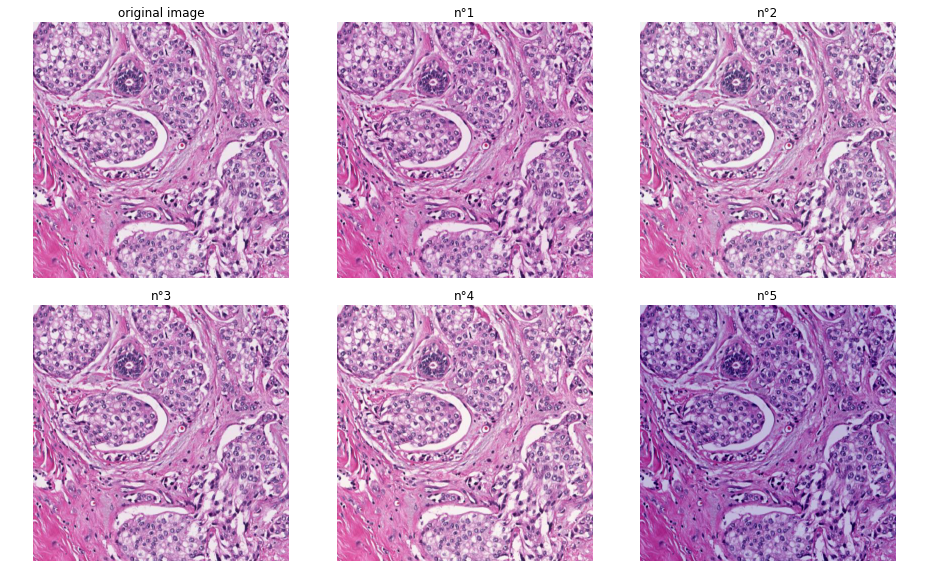

In [66]:
from transform import RandomHEaugmentation

he_aug = RandomHEaugmentation(0.025, 0.003)

show_augmentation(he_aug, tiles_list)

### Elastic Distorsion

Coded by a PhD student of the CMM at Mines ParisTech

In [50]:
from scipy.interpolate import interp2d
from scipy.ndimage.interpolation import map_coordinates

class ElasticDistortion(object): #attention : pas compatible avec rotation
    """Get distorted crop from image.

    Note that crop corner coordinates should be given following
    mathematics conventions, and not image processing conventions.

    Arguments:
        im: input image (2D, with 1 or more channels).
        crop_x, crop_y: coordinates of four points.
        shape: crop shape.
    Returns:
        crop: image containing resulting crop.
    """
    
    def __init__(self, original_size = 512, size = 224, r = 50): # r < crop_size / 2
        self.size = size
        self.original_size = original_size
        self.r = r
    
    def __call__(self,x):
        i_corners = np.array([0, self.size])
        j_corners = np.array([0, self.size])
        rand_stretch1 = random.randint(-self.r,self.r)
        rand_stretch2 = random.randint(-self.r,self.r)
        rand_stretch3 = random.randint(-self.r,self.r)
        rand_stretch4 = random.randint(-self.r,self.r)
        rand_stretch5 = random.randint(-self.r,self.r)
        rand_stretch6 = random.randint(-self.r,self.r)
        L = [rand_stretch1,rand_stretch2,rand_stretch3,rand_stretch4,rand_stretch5,rand_stretch6]
        maxi = max(L)
        rand1 = random.randint(maxi, self.original_size - self.size - 1 - maxi) #attention au stretch on peut pas partir de 0 ... dépend de la valeur générée par stretch. Idem on peut pas aller jusqu'au bout...
        rand2 = random.randint(maxi, self.original_size - self.size - 1 - maxi)
        crop_i = np.array([rand1,rand1 + rand_stretch2,rand1 + 224 + rand_stretch3,rand1 + 224 + rand_stretch5]) #on ne peut pas dépasser im_size = 512. Il faut générer toutes les coordonnées en random + stretch
        crop_j = np.array([rand2,rand2 + 224 + rand_stretch1,rand2 + rand_stretch4,rand2 + 224 + rand_stretch6])
        interp_i = interp2d(i_corners, j_corners, crop_i)
        interp_j = interp2d(i_corners, j_corners, crop_j)
    
        i = np.arange(self.size)
        j = np.arange(self.size)
        coords_i = interp_i(i, j)
        coords_j = interp_j(i, j)
        tab = np.asarray(x)
        if len(tab.shape) == 2: #Pour les images en niveau de gris
            crop = map_coordinates(tab, [coords_j, coords_i])
        else:
            crop = np.zeros(
                [coords_j.shape[0], coords_j.shape[1], tab.shape[2]], dtype=np.uint8
            )
            for channel in range(tab.shape[2]):
                crop[:, :, channel] = map_coordinates(
                    tab[:, :, channel], [coords_j, coords_i]
                )
        crop = Image.fromarray(crop)
        return crop

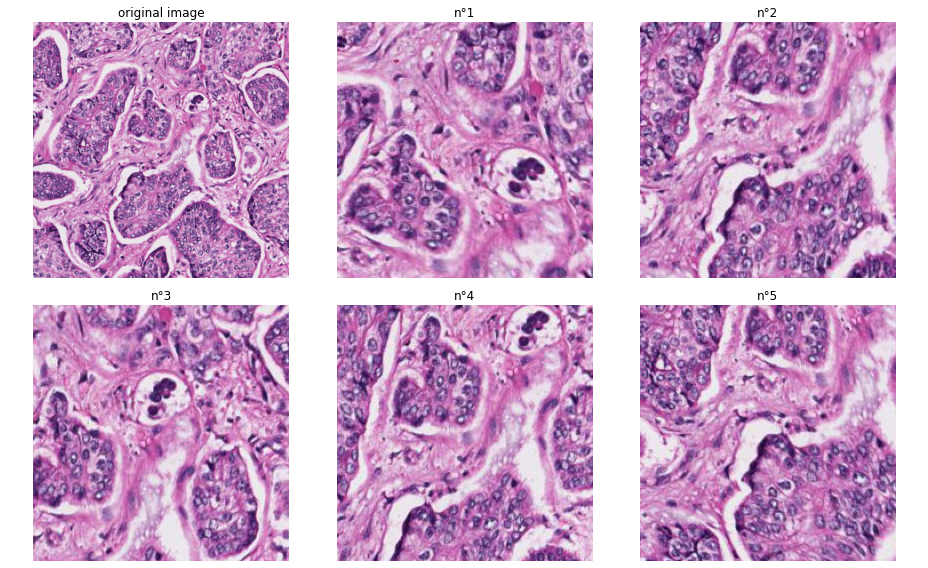

In [70]:
show_augmentation(ElasticDistortion(), tiles_list)

### Color Jitter 

With the parameters used by Owkin in their paper *Self-Supervision Closes the Gap Between Weak and
Strong Supervision in Histology, Olivier Dehaene et al.*

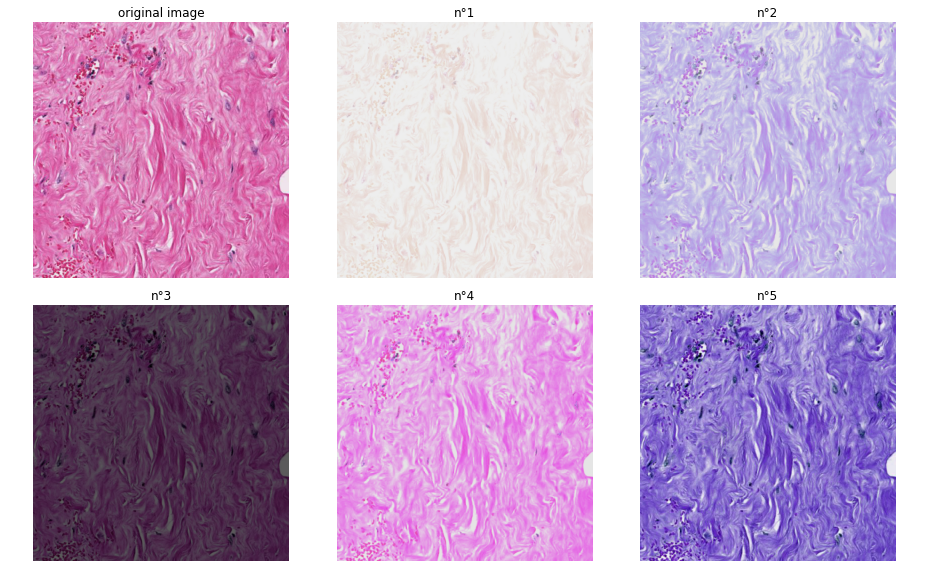

In [79]:
import torchvision.transforms as transforms
show_augmentation(transforms.ColorJitter(0.8, 0.8, 0.8, 0.2), tiles_list) # Owkin's parameters



In [ ]:
Random Gray

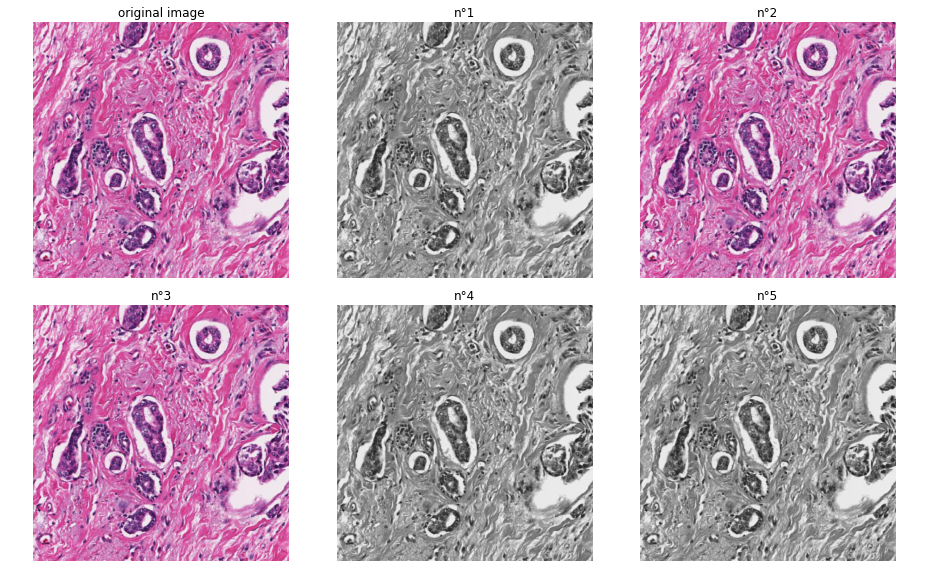

In [72]:
show_augmentation(transforms.RandomGrayscale(p=0.5), tiles_list)

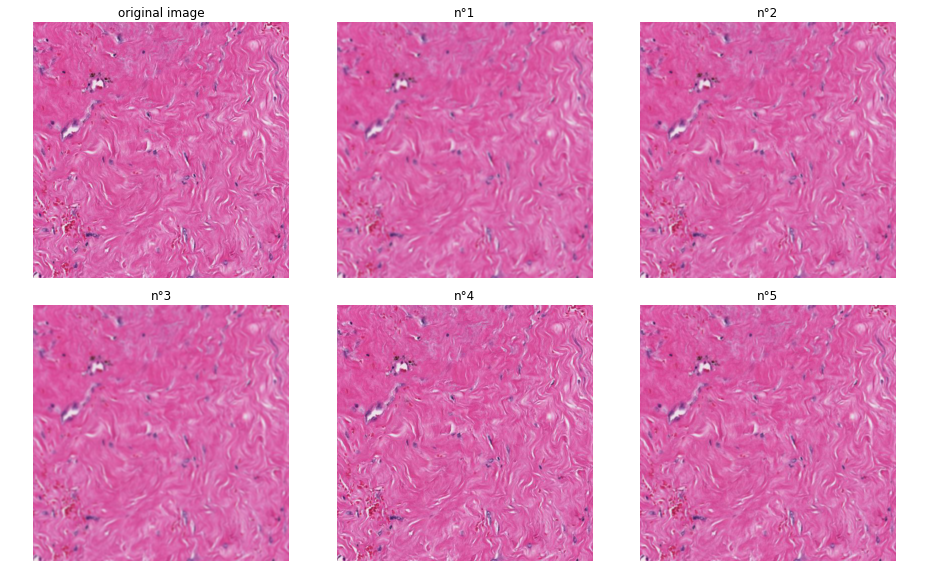

In [80]:
import moco.loader
show_augmentation(moco.loader.GaussianBlur([.1, 2.]), tiles_list) # Owkin's parameters

### Normalization   

In order to normalize the tiles, the mean and standard deviation have been calculated over the TCGA dataset:   

Mean: $[0.7231, 0.5152, 0.6622]$   
Standard deviation: $[0.1414, 0.1562, 0.1308]$